## 라이브러리 설치

In [ ]:
!pip install six numpy scipy Pillow matplotlib scikit-image opencv-python imageio Shapely
!pip install imgaug

In [ ]:
# https://github.com/aleju/imgaug
# https://nbviewer.org/github/aleju/imgaug-doc/blob/master/notebooks/A01%20-%20Load%20and%20Augment%20an%20Image.ipynb

## 이미지 객체 생성 / 변환 함수 생성 및 적용

<class 'imageio.core.util.Array'>
Original:


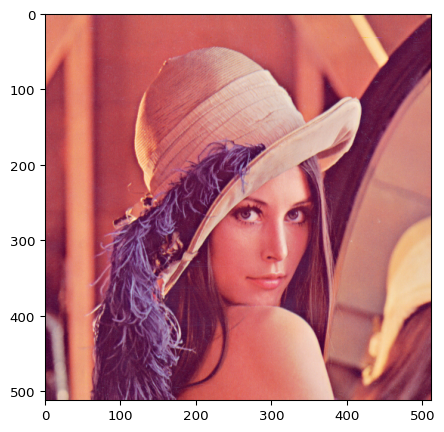

In [ ]:
import imageio
import imgaug as ia
%matplotlib inline

# 이미지 Load / Array 객체 생성
image = imageio.imread("https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png")

print(type(image))
print("Original:")
ia.imshow(image)

Augmented:


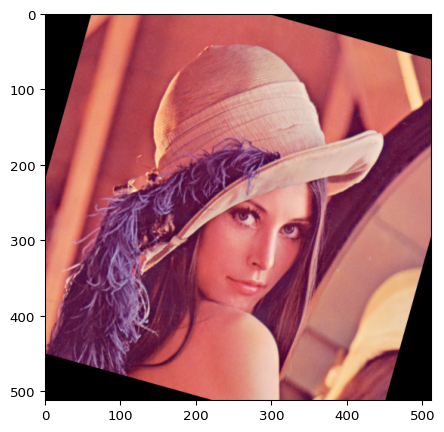

In [ ]:
from imgaug import augmenters as iaa
ia.seed(4)

rotate = iaa.Affine(rotate=(-25, 25)) # 회전 변환 함수 생성 (-25~25도 랜덤 회전)
image_aug = rotate(image=image)       # 변환 적용

print("Augmented:")
ia.imshow(image_aug)

Augmented batch:


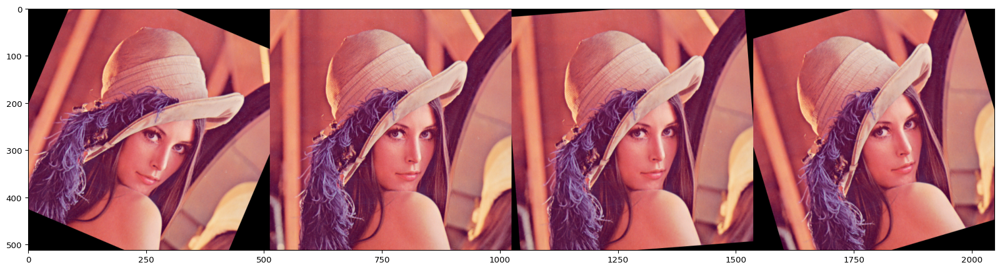

In [ ]:
import numpy as np

images = [image, image, image, image]
images_aug = rotate(images=images)  # 다수의 이미지 회전

print("Augmented batch:")
ia.imshow(np.hstack(images_aug))

Augmented:


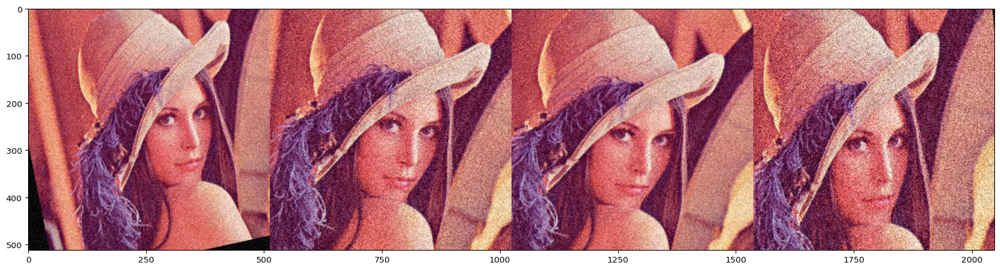

In [ ]:
# 여러 변환 함수를 적용시키기
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),               # 회전변환
    iaa.AdditiveGaussianNoise(scale=(10, 60)),  # 가우시안 노이즈
    iaa.Crop(percent=(0, 0.2))                  # 크롭(크기 유지)
])

images_aug = seq(images=images)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

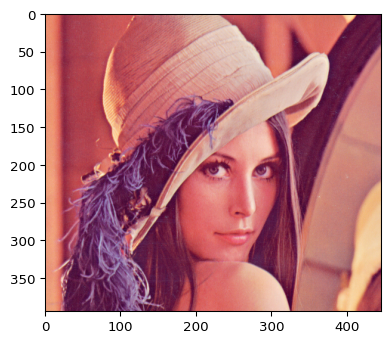

In [ ]:
image_aug = iaa.Crop(percent=(0.0, 0.2), keep_size=False)(image=image)
ia.imshow(image_aug)  # keep_size=False는 원본이미지의 크기로 복원하지 않는다.

Augmented:


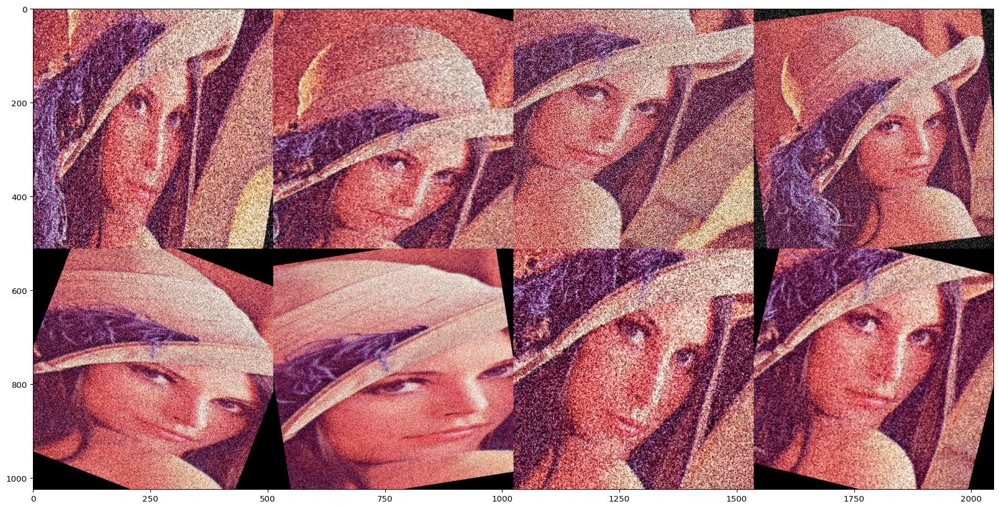

In [ ]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(30, 90)),
    iaa.Crop(percent=(0, 0.4))
], random_order=True) # random_order=True 변환 함수의 순서를 랜덤으로 적용한다.

images_aug = [seq(image=image) for _ in range(8)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

Image 0 (input shape: (257, 286, 3), output shape: (257, 286, 3))


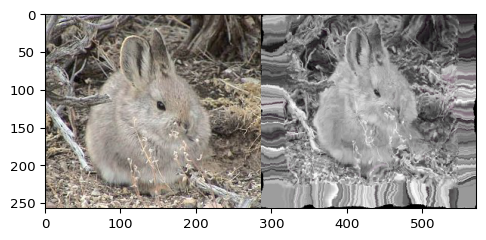

Image 1 (input shape: (536, 800, 3), output shape: (536, 800, 3))


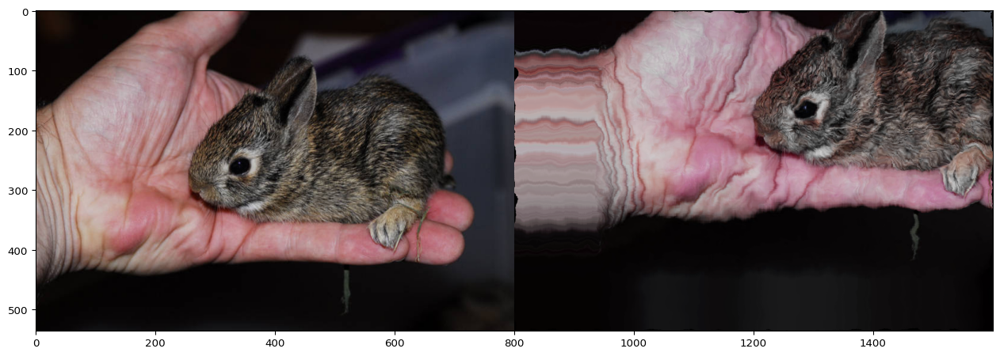

Image 2 (input shape: (289, 520, 3), output shape: (289, 520, 3))


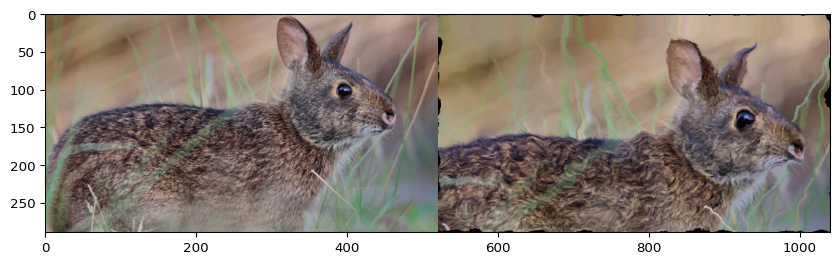

In [ ]:
seq = iaa.Sequential([
    iaa.CropAndPad(percent=(-0.2, 0.2), pad_mode="edge"),  # crop and pad images
    iaa.AddToHueAndSaturation((-60, 60)),  # change their color
    iaa.ElasticTransformation(alpha=90, sigma=9),  # water-like effect
    # iaa.Cutout()  # replace one squared area within the image by a constant intensity value
], random_order=True)

# load images with different sizes
images_different_sizes = [
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/e/ed/BRACHYLAGUS_IDAHOENSIS.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/c/c9/Southern_swamp_rabbit_baby.jpg"),
    imageio.imread("https://upload.wikimedia.org/wikipedia/commons/9/9f/Lower_Keys_marsh_rabbit.jpg")
]

# augment them as one batch
images_aug = seq(images=images_different_sizes) # 서로 다른 이미지 사이즈 들도 변환 가능

# visualize the results
print("Image 0 (input shape: %s, output shape: %s)" % (images_different_sizes[0].shape, images_aug[0].shape))
ia.imshow(np.hstack([images_different_sizes[0], images_aug[0]]))

print("Image 1 (input shape: %s, output shape: %s)" % (images_different_sizes[1].shape, images_aug[1].shape))
ia.imshow(np.hstack([images_different_sizes[1], images_aug[1]]))

print("Image 2 (input shape: %s, output shape: %s)" % (images_different_sizes[2].shape, images_aug[2].shape))
ia.imshow(np.hstack([images_different_sizes[2], images_aug[2]]))

## 바운딩 박스가 포함된 이미지를 변환하기

In [ ]:
# https://nbviewer.org/github/aleju/imgaug-doc/blob/master/notebooks/B02%20-%20Augment%20Bounding%20Boxes.ipynb

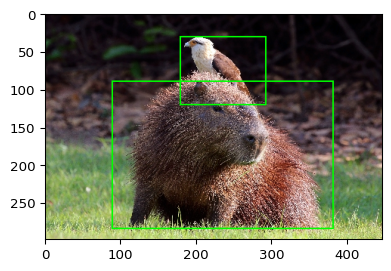

In [ ]:
import imageio
import imgaug as ia
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
%matplotlib inline
ia.seed(1)

image = imageio.imread("https://upload.wikimedia.org/wikipedia/commons/8/8e/Yellow-headed_caracara_%28Milvago_chimachima%29_on_capybara_%28Hydrochoeris_hydrochaeris%29.JPG")
image = ia.imresize_single_image(image, (298, 447))

bbs = BoundingBoxesOnImage([
    BoundingBox(x1=0.2*447, x2=0.85*447, y1=0.3*298, y2=0.95*298),
    BoundingBox(x1=0.4*447, x2=0.65*447, y1=0.1*298, y2=0.4*298)
], shape=image.shape) # 바운딩 박스 만들기(이미지와 같은 크기를 기준으로 만든다.)

ia.imshow(bbs.draw_on_image(image, size=2))

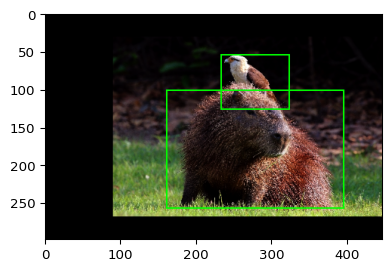

In [ ]:
from imgaug import augmenters as iaa 
ia.seed(1)

seq = iaa.Sequential([
    iaa.GammaContrast(1.5),
    iaa.Affine(translate_percent={"x": 0.1}, scale=0.8)
])

image_aug, bbs_aug = seq(
    image=image,  
     bounding_boxes=bbs,
) # 이미지와 바운딩 박스에 변환 함수 적용

ia.imshow(bbs_aug.draw_on_image(image_aug, size=2))

In [ ]:
lat = ['x1', 'x2', 'y1', 'y2']
for i in range(2):
  print(f'{i}번째 바운딩 박스의 변환 후 위치 정보')
  for la in lat:
    print(f'  {la}: {getattr(bbs_aug.bounding_boxes[i], la):.2f}')

0번째 바운딩 박스의 변환 후 위치 정보
  x1: 161.12
  x2: 393.56
  y1: 101.22
  y2: 256.18
1번째 바운딩 박스의 변환 후 위치 정보
  x1: 232.64
  x2: 322.04
  y1: 53.54
  y2: 125.06


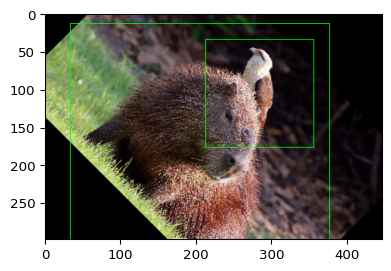

In [ ]:
# 회전변환 적용
image_aug, bbs_aug = iaa.Affine(rotate=45)(image=image, bounding_boxes=bbs)
ia.imshow(bbs_aug.draw_on_image(image_aug))

In [ ]:
lat = ['x1', 'x2', 'y1', 'y2']
for i in range(2):
  print(f'{i}번째 바운딩 박스의 변환 후 위치 정보')
  for la in lat:
    print(f'  {la}: {getattr(bbs_aug.bounding_boxes[i], la):.2f}')

0번째 바운딩 박스의 변환 후 위치 정보
  x1: 33.35
  x2: 375.77
  y1: 12.24
  y2: 354.66
1번째 바운딩 박스의 변환 후 위치 정보
  x1: 212.46
  x2: 354.70
  y1: 33.31
  y2: 175.55


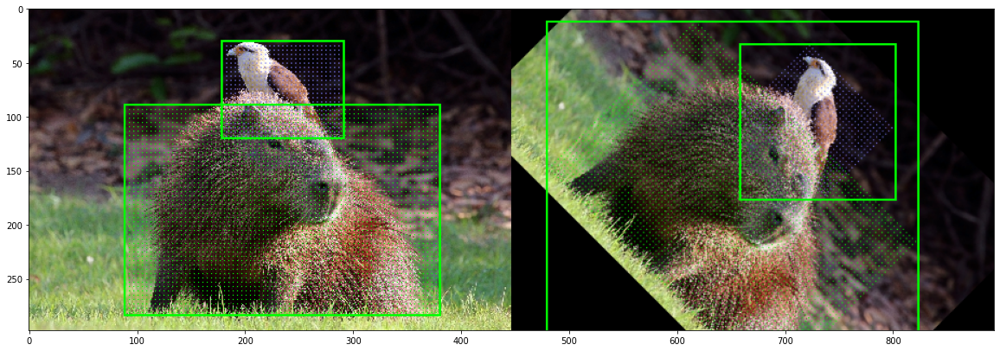

In [ ]:
# 변환 전후의 바운딩 박스 확인하기
import numpy as np
import matplotlib.pyplot as plt

# highlight the area of each bounding box
image_points = np.copy(image)
colors = [(0, 255, 0), (128, 128, 255)]
for bb, color in zip(bbs.bounding_boxes, colors):
    image_points[bb.y1_int:bb.y2_int:4, bb.x1_int:bb.x2_int:4] = color

# rotate the image with the highlighted bounding box areas
rot = iaa.Affine(rotate=45)
image_points_aug, bbs_aug = rot(image=image_points, bounding_boxes=bbs)

# visualize
side_by_side = np.hstack([
    bbs.draw_on_image(image_points, size=2),
    bbs_aug.draw_on_image(image_points_aug, size=2)
])
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(side_by_side)

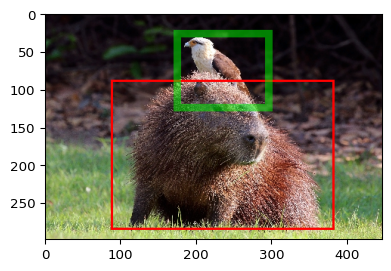

In [ ]:
# 바운딩 박스 표시 방식 커스터마이징
image_bbs = np.copy(image)
image_bbs = bbs.bounding_boxes[0].draw_on_image(image_bbs, color=[255, 0, 0], size=3)
image_bbs = bbs.bounding_boxes[1].draw_on_image(image_bbs, color=[0, 255, 0], size=10, alpha=0.5)
ia.imshow(image_bbs)

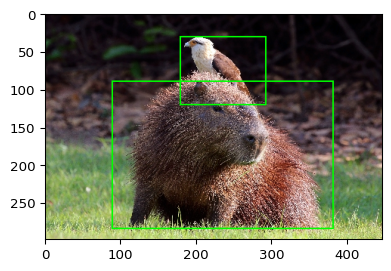

In [ ]:
bbs_labeled = bbs.deepcopy()

# 바운딩 박스의 label을 설정하고 출력하기
# 코드 수정
# bbs_labeled[0].label = "approximately a pig"
# bbs_labeled[1].label = "bird"
bbs_labeled.bounding_boxes[0].label = "approximately a pig"
bbs_labeled.bounding_boxes[1].label = "bird"

image_bbs = bbs_labeled.draw_on_image(image, size=2)

# label이 나오지 않는 오류
ia.imshow(image_bbs)

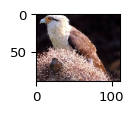

In [ ]:
# 바운딩 박스 내 이미지를 크롭하여 출력
bird = bbs.bounding_boxes[1].extract_from_image(image)
ia.imshow(bird)

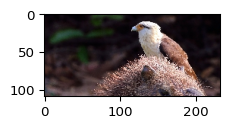

In [ ]:
# 바운딩 박스 내 이미지 확장하기(상하우: 10px, 좌: 100px)
bird = bbs.bounding_boxes[1].extend(all_sides=10, left=100).extract_from_image(image)
ia.imshow(bird)

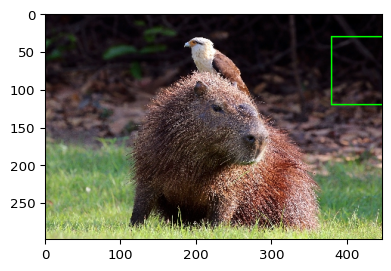

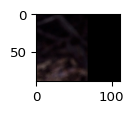

In [ ]:
# 바운딩 박스 위치 조정하기
# 코드 수정
# bb = bbs.bounding_boxes[1].shift(x=200)

bb = bbs.bounding_boxes[1].shift(left=200)  # 오른쪽으로 200px 이동
ia.imshow(bb.draw_on_image(image, size=2))
ia.imshow(bb.extract_from_image(image))